## Importing Relavant Libraries

In [1]:
import os
import cv2
from tqdm import tqdm
import pandas as pd 
import numpy as np
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff
from matplotlib import pyplot as plt
%matplotlib inline
SAMPLE_LEN=100

In [2]:
# Default figure size for EDA
from matplotlib.pylab import rcParams
rcParams["figure.figsize"] = (14, 7)

In [3]:
# Ignoring future warning
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Reading Data

In [30]:
train_image_path = r"C:\Users\shang\Downloads\Path Analogy data visualization\Path Analogy data visualization\train_images"
train_df_path = r"C:\Users\shang\Downloads\Path Analogy data visualization\Path Analogy data visualization\train.csv"

In [31]:
df_train = pd.read_csv(train_df_path)
df_train.head()

,image,labels
0,800113bb65efe69e.jpg,healthy
1,8002cb321f8bfcdf.jpg,scab frog_eye_leaf_spot complex
2,80070f7fb5e2ccaa.jpg,scab
3,80077517781fb94f.jpg,scab
4,800cbf0ff87721f8.jpg,complex


In [32]:
df_train.shape

(18632, 2)

## Visualization

In [33]:
def per_on_bar(plot,feature):
    total = len(feature)
    for p in plot.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.08
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 12)
    plt.show()

In [34]:
cat = df_train.labels.unique()
print("Following categories are present in dataset.")
i=1
for j in cat:
    print(i, j)
    i=i+1

Following categories are present in dataset.
1 healthy
2 scab frog_eye_leaf_spot complex
3 scab
4 complex
5 rust
6 frog_eye_leaf_spot
7 powdery_mildew
8 scab frog_eye_leaf_spot
9 frog_eye_leaf_spot complex
10 rust frog_eye_leaf_spot
11 powdery_mildew complex
12 rust complex


In [35]:
df_train['labels'].value_counts()

scab                               4826
healthy                            4624
frog_eye_leaf_spot                 3181
rust                               1860
complex                            1602
powdery_mildew                     1184
scab frog_eye_leaf_spot             686
scab frog_eye_leaf_spot complex     200
frog_eye_leaf_spot complex          165
rust frog_eye_leaf_spot             120
rust complex                         97
powdery_mildew complex               87
Name: labels, dtype: int64

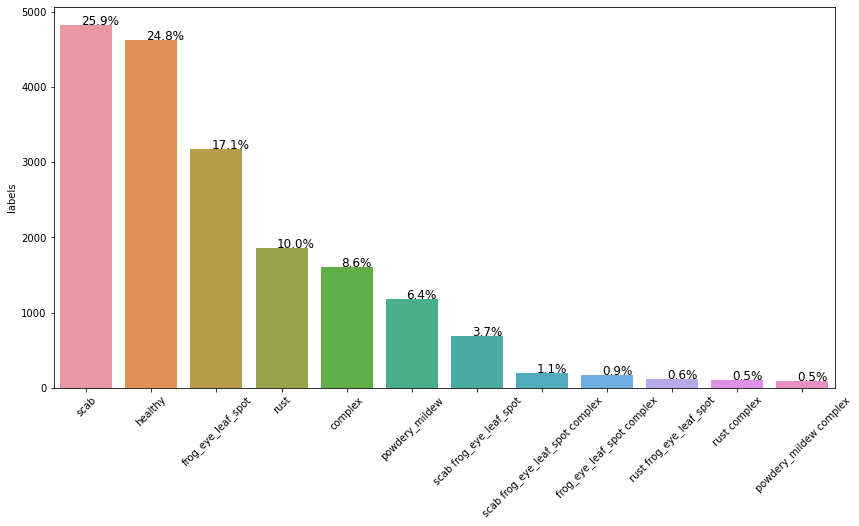

In [36]:
plt.figure(figsize=(14, 7))
ax = sns.barplot(x=df_train.labels.value_counts().index, y=df_train.labels.value_counts())
plt.xticks(rotation=45)
per_on_bar(ax, df_train.labels)

Almost 50% of records lie under Scab, Healthy category

In [37]:
df_train.labels.unique()
px.pie(df_train, names="labels", title="Labels Distribution between Categories", hole=0.4)

## Image Analysis

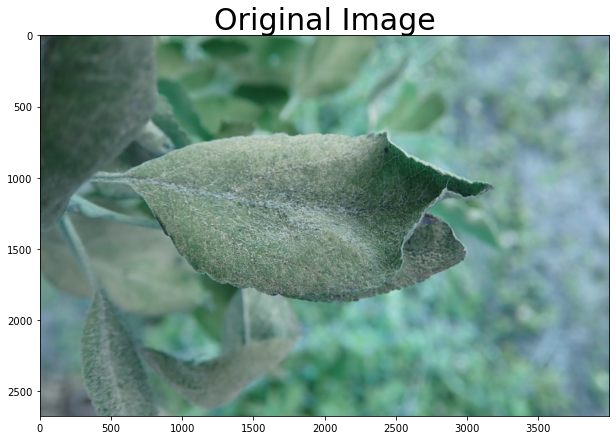

In [38]:
image = cv2.imread(os.path.join(train_image_path,"800113bb65efe69e.jpg"))
plt.title("Original Image", fontsize=30)
plt.imshow(image)
plt.show()

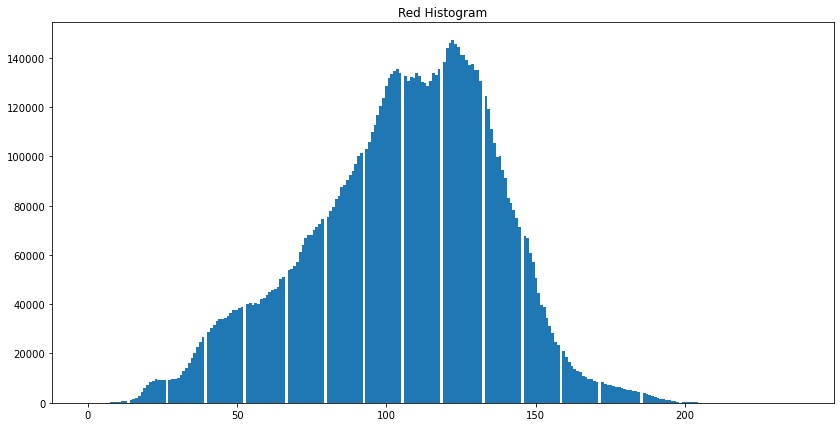

In [39]:
red = image[:, :, 0] # using the red channel of the rocket image.

plt.hist(red.ravel(), bins=256) # plot its histogram with 256 bins, the number of possible values of a pixel.
plt.title('Red Histogram')
plt.show()

Frequency of the pixels varies between 25 to 250 , with most of it being in the region between 100 to 175 approximately

In [40]:
img_shapes = {}
for image_name in tqdm(os.listdir(train_image_path)[:300]):
    image = cv2.imread(os.path.join(train_image_path, image_name))
    img_shapes[image.shape] = img_shapes.get(image.shape, 0) + 1

print(img_shapes)

100%|██████████| 300/300 [00:28<00:00, 10.46it/s]

{(2672, 4000, 3): 265, (3000, 4000, 3): 11, (1728, 2592, 3): 18, (3456, 4608, 3): 2, (3456, 5184, 3): 4}


Found that the images are of very high resolution so we then applied resizing the image to improve runtime.

In [46]:
def visualize_batch(path,image_ids, labels, plot_shape):
    plt.figure(figsize=(16, 12))
    
    for ind, (image_id, label) in enumerate(zip(image_ids, labels)):
        plt.subplot(plot_shape, plot_shape, ind + 1)
        image = cv2.imread(os.path.join(path, image_id))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        plt.imshow(image)
        plt.title(f"Class: {label}", fontsize=12)
        plt.axis("off")
    plt.show()

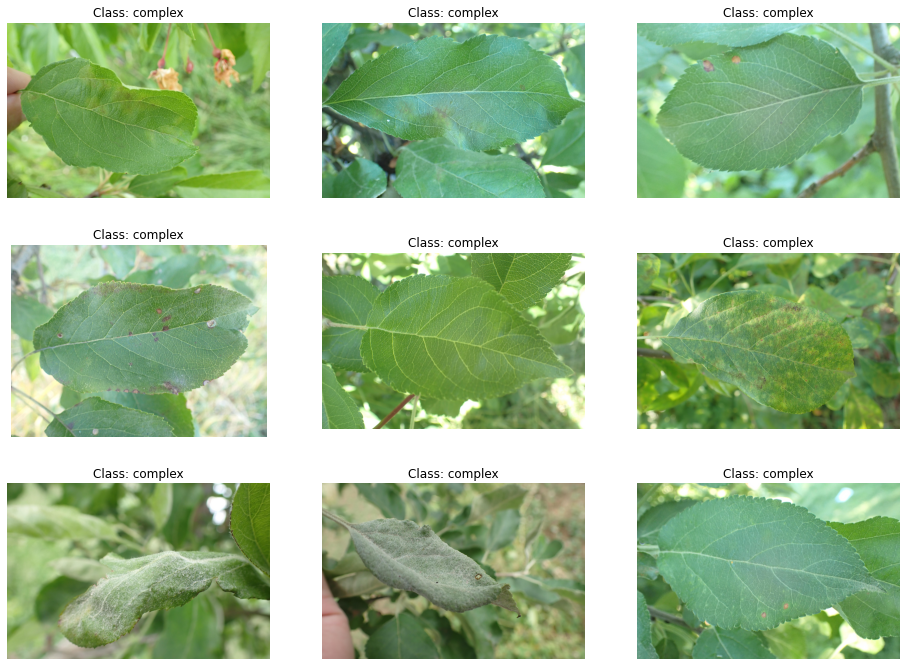

In [49]:
image_ids = df_train.sample(9)["image"].values
visualize_batch(train_image_path,image_ids,tmp_df["labels"].values, 3)

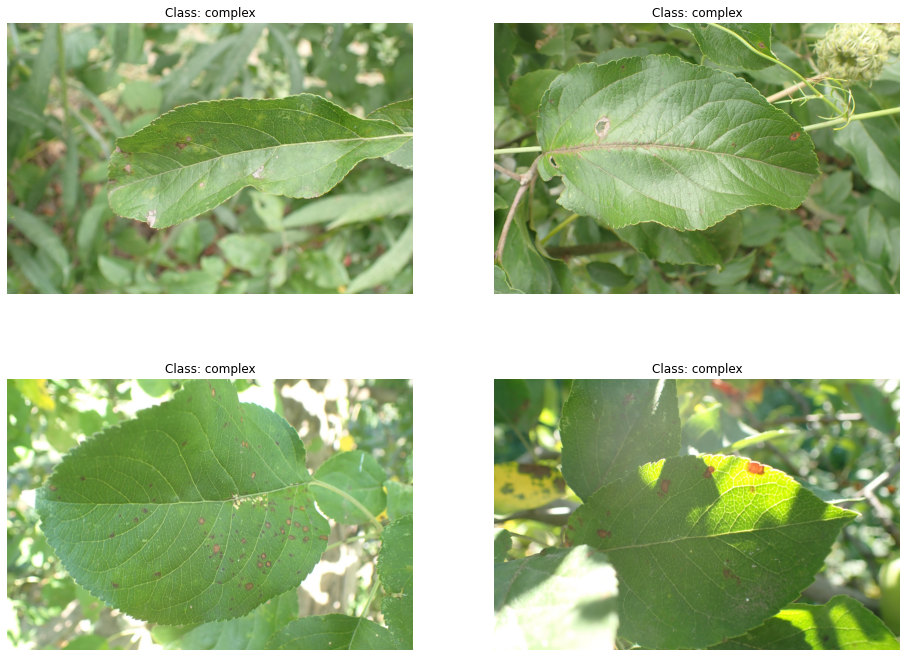

In [50]:
#label = complex
tmp_df = df_train[df_train["labels"] == "complex"]
visualize_batch(train_image_path, tmp_df.sample(4)["image"].values, tmp_df["labels"].values, 2)

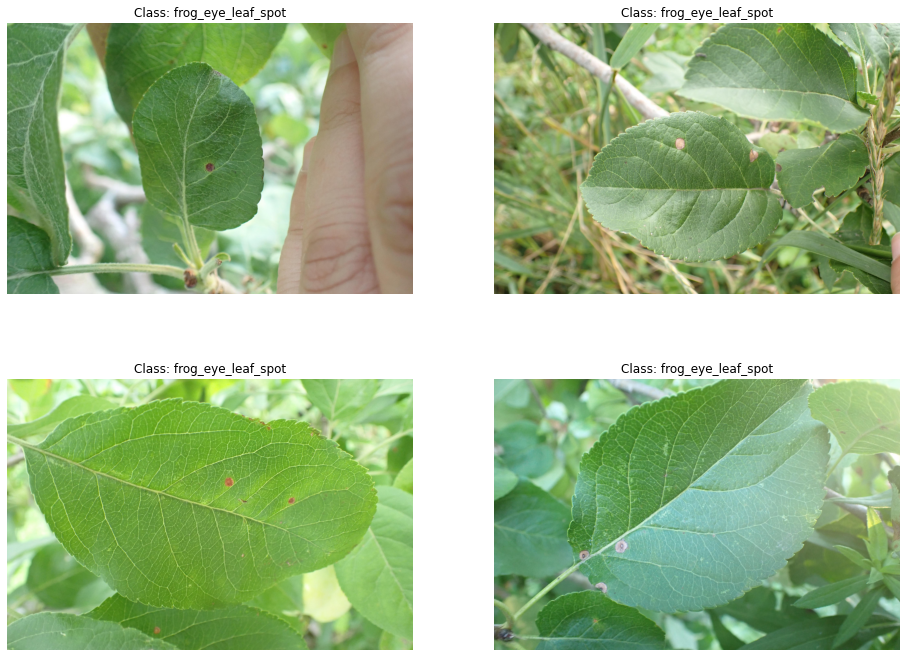

In [51]:
#label = frog_eye_leaf_spot
tmp_df = df_train[df_train["labels"] == "frog_eye_leaf_spot"]
visualize_batch(train_image_path, tmp_df.sample(4)["image"].values, tmp_df["labels"].values, 2)

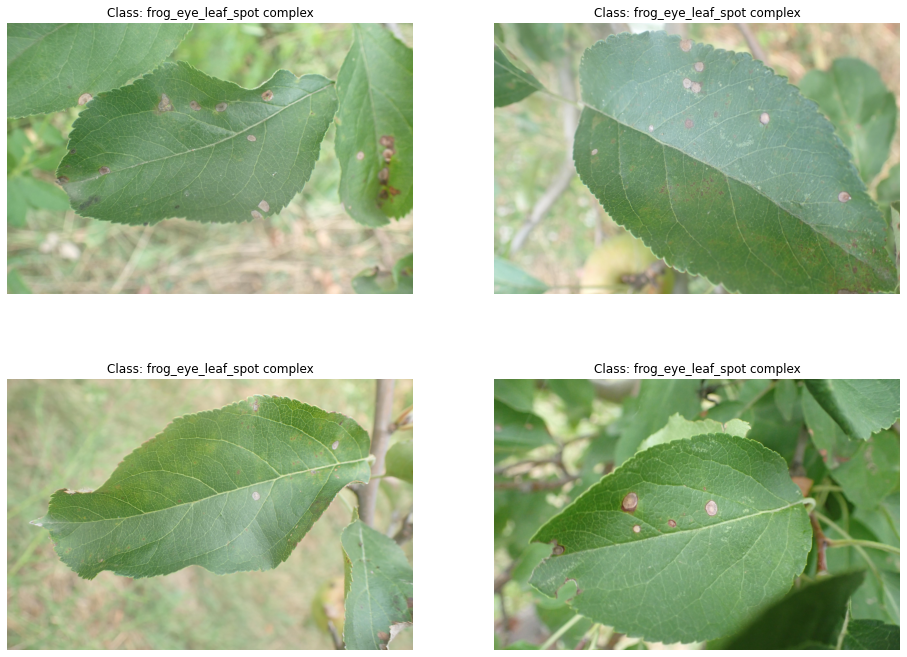

In [52]:
#label = frog_eye_leaf_spot complex
tmp_df = df_train[df_train["labels"] == "frog_eye_leaf_spot complex"]
visualize_batch(train_image_path, tmp_df.sample(4)["image"].values, tmp_df["labels"].values, 2)

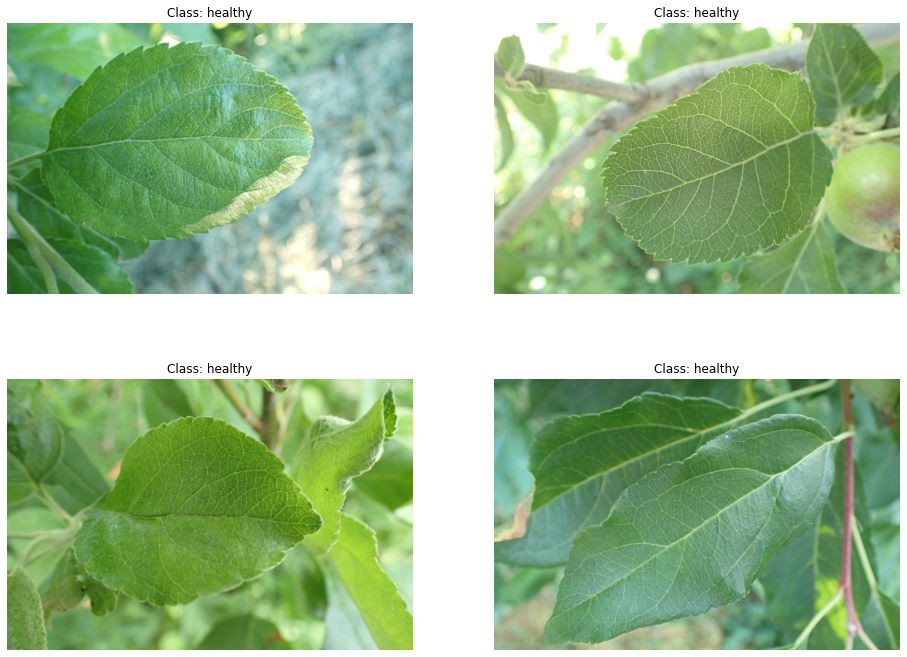

In [53]:
#label = healthy
tmp_df = df_train[df_train["labels"] == "healthy"]
visualize_batch(train_image_path, tmp_df.sample(4)["image"].values, tmp_df["labels"].values, 2)

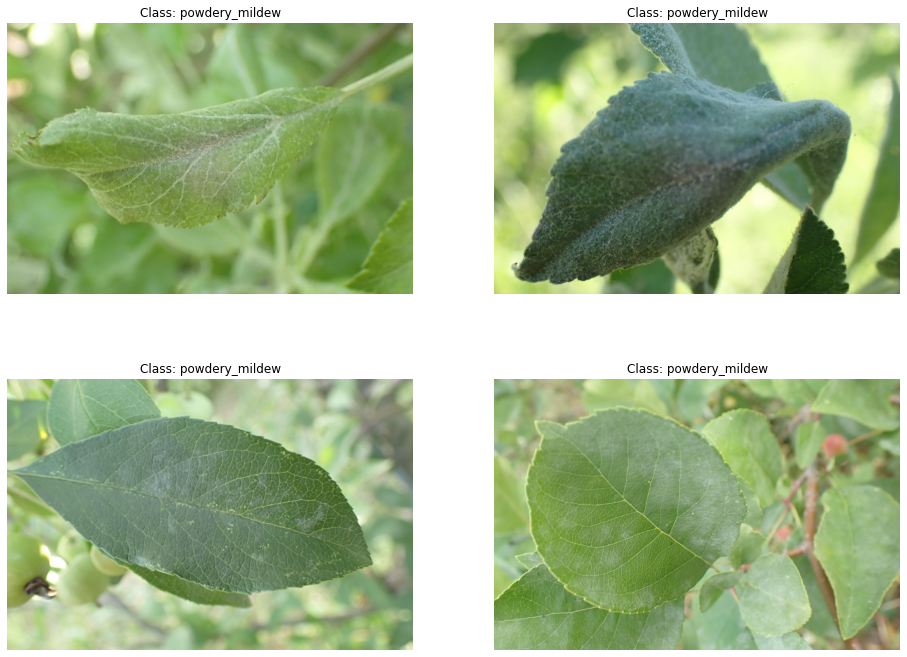

In [54]:
#label = powdery_mildew
tmp_df = df_train[df_train["labels"] == "powdery_mildew"]
visualize_batch(train_image_path, tmp_df.sample(4)["image"].values, tmp_df["labels"].values, 2)

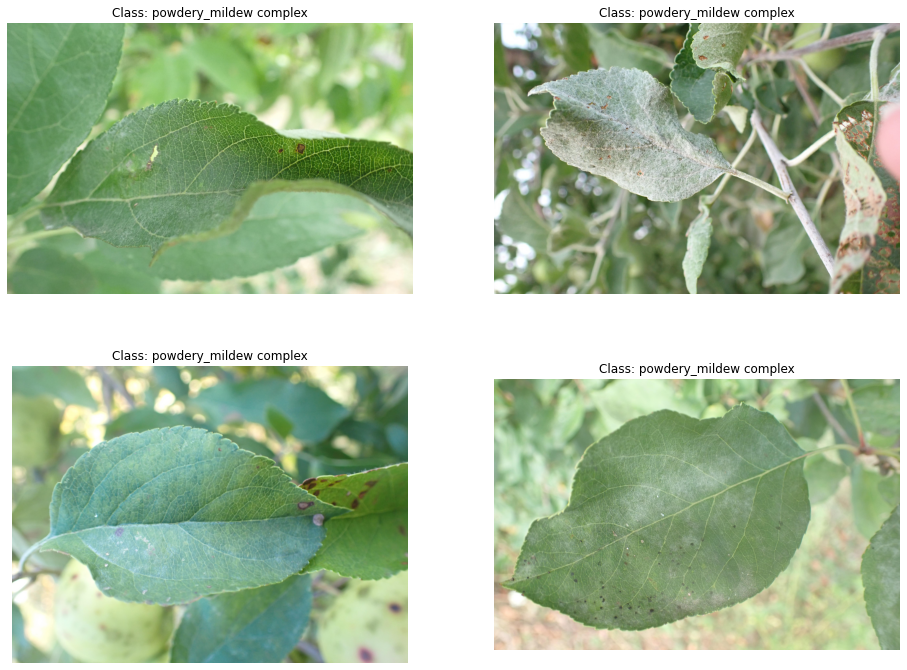

In [55]:
#label = powdery_mildew complex
tmp_df = df_train[df_train["labels"] == "powdery_mildew complex"]
visualize_batch(train_image_path, tmp_df.sample(4)["image"].values, tmp_df["labels"].values, 2)

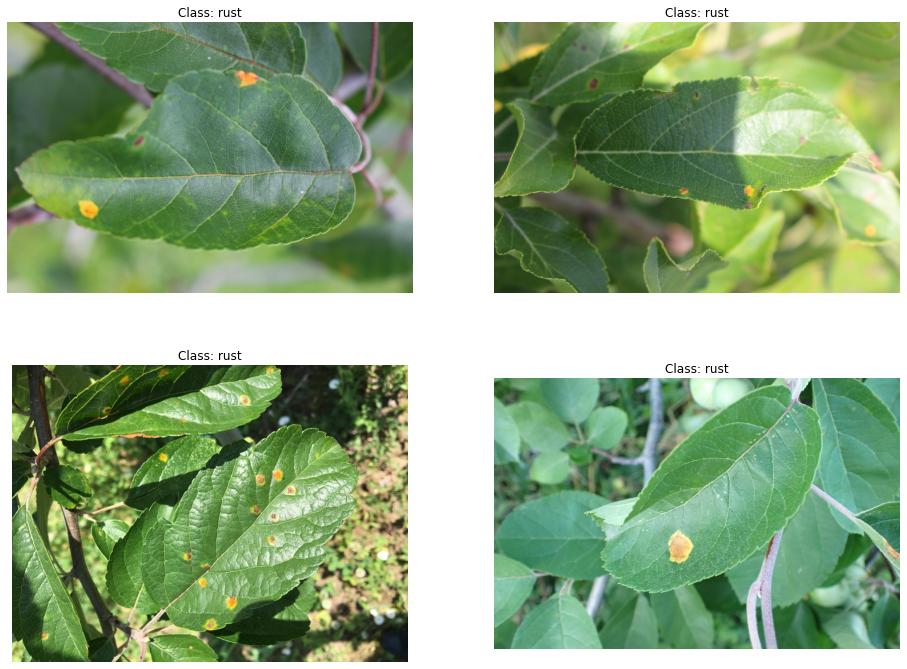

In [56]:
#label = rust
tmp_df = df_train[df_train["labels"] == "rust"]
visualize_batch(train_image_path, tmp_df.sample(4)["image"].values, tmp_df["labels"].values, 2)

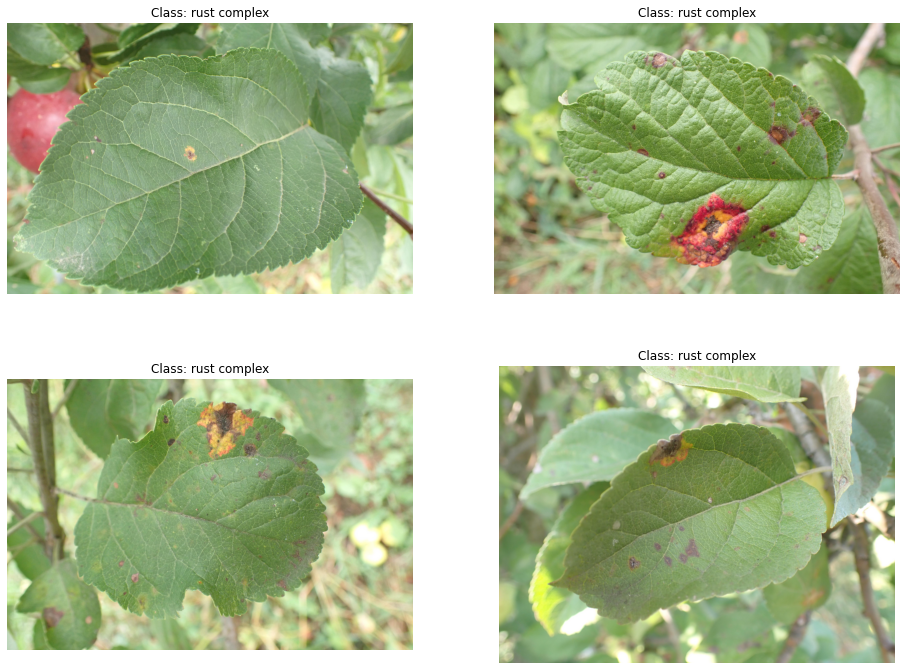

In [57]:
#label = rust complex
tmp_df = df_train[df_train["labels"] == "rust complex"]
visualize_batch(train_image_path, tmp_df.sample(4)["image"].values, tmp_df["labels"].values, 2)

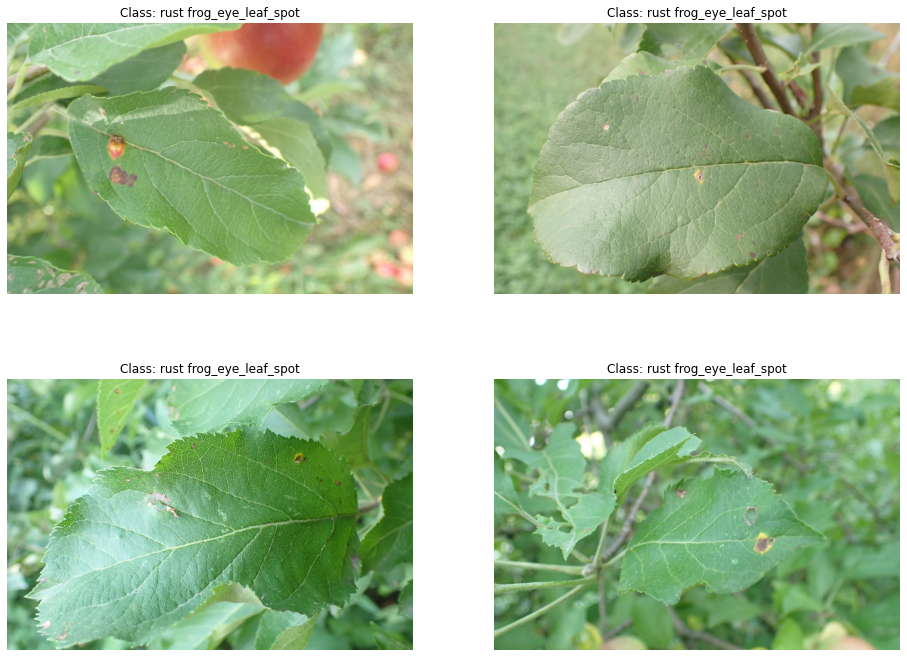

In [58]:
#label = rust frog_eye_leaf_spot
tmp_df = df_train[df_train["labels"] == "rust frog_eye_leaf_spot"]
visualize_batch(train_image_path, tmp_df.sample(4)["image"].values, tmp_df["labels"].values, 2)

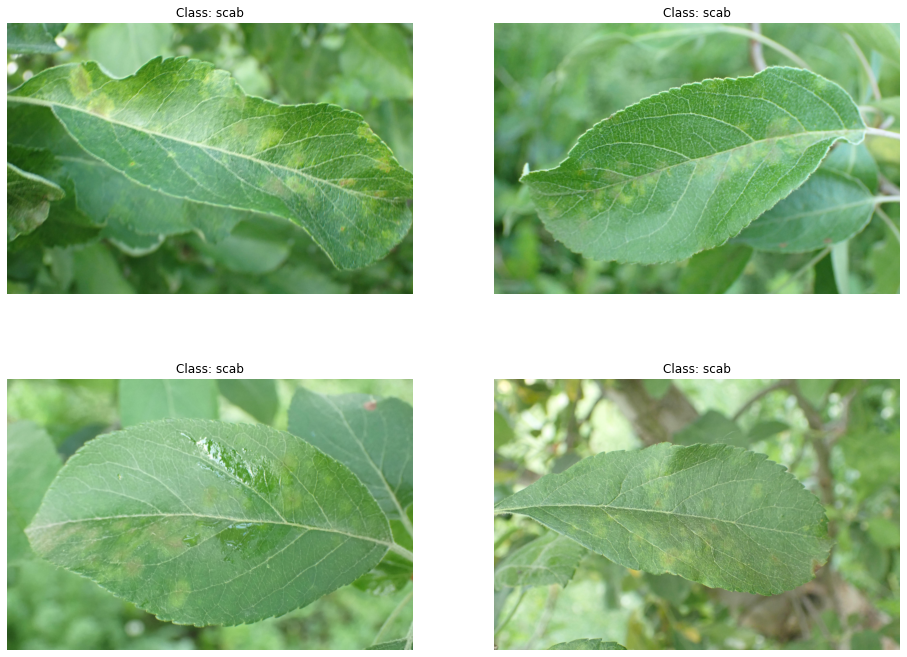

In [59]:
#label = scab
tmp_df = df_train[df_train["labels"] == "scab"]
visualize_batch(train_image_path, tmp_df.sample(4)["image"].values, tmp_df["labels"].values, 2)

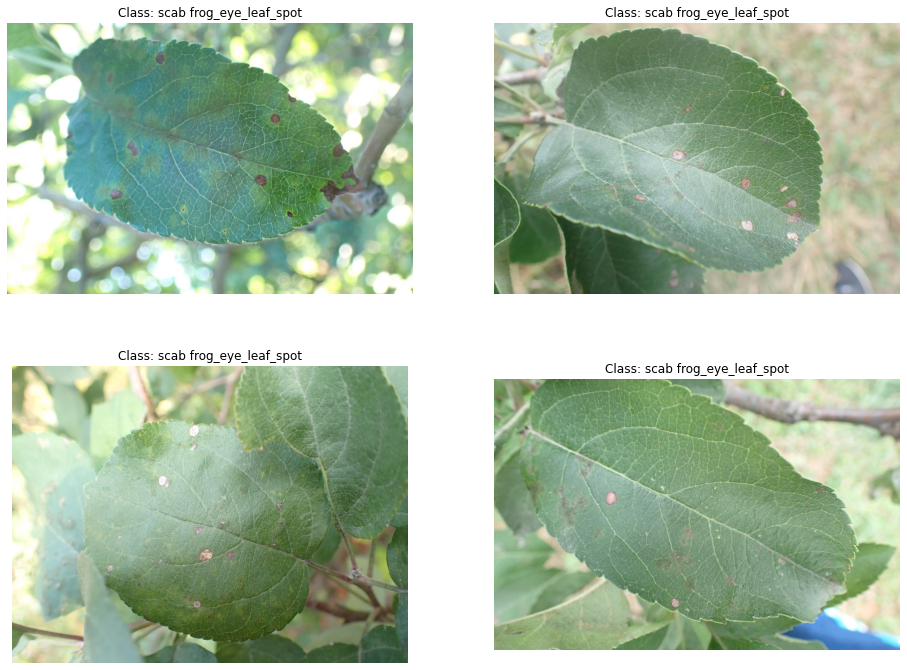

In [60]:
#label = scab frog_eye_leaf_spot
tmp_df = df_train[df_train["labels"] == "scab frog_eye_leaf_spot"]
visualize_batch(train_image_path, tmp_df.sample(4)["image"].values, tmp_df["labels"].values, 2)